In [1]:
import numpy as np
import matplotlib.pyplot as plt
import dedalus.public as d3
import logging
logger = logging.getLogger(__name__)

[ruth-macbook.local:32231] shmem: mmap: an error occurred while determining whether or not /var/folders/bg/tg7qc0rx1qxdpz1j_8l_xj440000gq/T//ompi.ruth-macbook.503/jf.0/2572091392/sm_segment.ruth-macbook.503.994f0000.0 could be created.


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
mpl.rc('text', usetex = True)
mpl.rc('font', family = 'serif')
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rcParams.update({'font.size': 18})


**main addition to this notebook is that I've come back to check if the system works when defined in PolarCoordinates in the Annular basis**

Given that we'll be working directly in polar coordinates we can keep the system defined in vector form rather than explicitly including and keeping track of all the $1/r$ terms that fall out in the polar to cartesian translation.

So instead of,
$$\underbrace{\frac{1}{H} \Big(\partial_{rr}\Phi +\frac{1}{r}\partial_{r}\Phi + \frac{1}{r^2}\partial_{\theta\theta}\Phi\Big)}_{\frac{1}{H}\nabla^2\Phi}+    \underbrace{\partial_r\Phi \partial_r \big(\frac{1}{H}\big)+\frac{1}{r^2}\partial_\theta\Phi \partial_\theta \big(\frac{1}{H}\big)}_{\nabla(\frac{1}{H})\cdot \nabla \Phi}+
\underbrace{\frac{i}{r \omega}\Big(\partial_r\Phi \partial_\theta\big(\frac{1}{H}\big)-\partial_\theta\Phi \partial_r\big(\frac{1}{H}\big)   \Big)}_{\frac{i}{\omega}\boldsymbol{\hat{k}}\cdot(\nabla \Phi \times \nabla(\frac{1}{H}))}+\tau_1 V_{n-1}+\tau_2  V_{n-2}=0.$$

We can simply write it out as,

$$\frac{1}{h}\nabla^2\Phi + \nabla(\frac{1}{h})\cdot\nabla\Phi+\frac{i}{\omega}\hat{\mathbf{k}}\cdot\Big(\nabla\Phi\times\nabla(\frac{1}{h})\Big) = 0$$

and we can probably expand it out and multiply through by $h$ as we did in the IVP...I think that just comes out to

$$h\nabla^2\Phi - (\nabla h \cdot\nabla\Phi)-\frac{i}{\omega}\hat{\mathbf{k}}\cdot\Big(\nabla\Phi\times\nabla h\Big) = 0$$

but I'll try the non simplified version first just to check my math.

BC's are same as always, have reimplemented Dirichlet Neumann in the new basis.

In [4]:
from dedalus.core.operators import SpectralOperator1D

class ComplexFourierPseudodifferential(SpectralOperator1D):

    input_basis_type = d3.ComplexFourier
    subaxis_dependence = [True]
    subaxis_coupling = [False]

    def __init__(self, operand, coord, out=None):
        super().__init__(operand, out=out)
        # SpectralOperator requirements
        self.coord = coord
        self.input_basis = operand.domain.get_basis(coord)
        self.output_basis = self.input_basis
        self.first_axis = self.dist.get_basis_axis(self.input_basis)
        self.last_axis = self.first_axis
        self.axis = self.first_axis
        # LinearOperator requirements
        self.operand = operand
        # FutureField requirements
        self.domain = operand.domain.substitute_basis(self.input_basis, self.output_basis)
        self.tensorsig = operand.tensorsig
        self.dtype = operand.dtype

    @classmethod
    def _group_matrix(cls, group, input_basis, output_basis):
        # Rescale group (native wavenumber) to get physical wavenumber
        k = group / input_basis.COV.stretch
        # dx exp(1j*k*x) = 1j * k * exp(1j*k*x)
        return np.array([[cls.k_func(k)]])


class abs_m_cls(ComplexFourierPseudodifferential):

    name = "abs_m"

    @classmethod
    def k_func(cls, k):
        return abs(k)

    def new_operand(self, operand, **kw):
        if operand == 0:
            return 0
        return abs_m_cls(operand,  self.coord, **kw)

In [5]:
# from dedalus.core.operators import SpectralOperator1D

# class ComplexFourierPseudodifferential(SpectralOperator1D):

#     input_basis_type = d3.ComplexFourier
#     subaxis_dependence = [True]
#     subaxis_coupling = [False]

#     def __init__(self, operand, coord, out=None):
#         super().__init__(operand, out=out)
#         # SpectralOperator requirements
#         self.coord = coord
#         self.input_basis = operand.domain.get_basis(coord)
#         self.output_basis = self.input_basis
#         self.first_axis = self.dist.get_basis_axis(self.input_basis)
#         self.last_axis = self.first_axis
#         self.axis = self.first_axis
#         # LinearOperator requirements
#         self.operand = operand
#         # FutureField requirements
#         self.domain = operand.domain.substitute_basis(self.input_basis, self.output_basis)
#         self.tensorsig = operand.tensorsig
#         self.dtype = operand.dtype

#     @classmethod
#     def _group_matrix(cls, group, input_basis, output_basis):
#         # Rescale group (native wavenumber) to get physical wavenumber
#         k = group 
#         # dx exp(1j*k*x) = 1j * k * exp(1j*k*x)
#         return np.array([[cls.k_func(k)]])


# class abs_m_cls(ComplexFourierPseudodifferential):

#     name = "abs_m"

#     @classmethod
#     def k_func(cls, k):
#         return abs(k)

#     def new_operand(self, operand, **kw):
#         if operand == 0:
#             return 0
#         return abs_m_cls(operand,  self.coord, **kw)

# class RealFourierPseudodifferential(SpectralOperator1D):

#     input_basis_type = d3.RealFourier
#     subaxis_dependence = [True]
#     subaxis_coupling = [False]

#     def __init__(self, operand, coord, out=None):
#         super().__init__(operand, out=out)
#         # SpectralOperator requirements
#         self.coord = coord
#         self.input_basis = operand.domain.get_basis(coord)
#         self.output_basis = self.input_basis
#         self.first_axis = self.dist.get_basis_axis(self.input_basis)
#         self.last_axis = self.first_axis
#         self.axis = self.first_axis
#         # LinearOperator requirements
#         self.operand = operand
#         # FutureField requirements
#         self.domain = operand.domain.substitute_basis(self.input_basis, self.output_basis)
#         self.tensorsig = operand.tensorsig
#         self.dtype = operand.dtype

#     @classmethod
#     def _group_matrix(cls, group, input_basis, output_basis):
#         # Rescale group (native wavenumber) to get physical wavenumber
#         k = group / input_basis.COV.stretch
#         return np.array([[cls.k_func(k), 0],[0, cls.k_func(k)]])


# class re_abs_m_cls(RealFourierPseudodifferential):

#     name = "abs_m"

#     @classmethod
#     def k_func(cls, k):
#         return abs(k)

#     def new_operand(self, operand, **kw):
#         if operand == 0:
#             return 0
#         return abs_m_cls(operand,  self.coord, **kw)

# Dirichlet 

## (includes `hinv` terms)

In [6]:
Ri, Ro, Rb = 0.5, 4, 1 #note - Ri (inner radius) is 'a' from previous, also we will now have Rb as a parameter for the shelf break / edge of the bathymetry 
Nθ, Nr = 64, 64 #resolution (want higher in r than θ)
α = 1 #bathymetry parameter
dealias = 2

## basis
dtype   = np.complex128
coords  = d3.PolarCoordinates('θ', 'r')
dist    = d3.Distributor(coords, dtype=dtype)
basis   = d3.AnnulusBasis(coords, shape = (Nθ, Nr), radii = (Ri,Ro), dealias = dealias, dtype = dtype)

# Fields
Φ    = dist.Field(name='Φ',    bases=basis)
tau1 = dist.Field(name='tau1', bases=basis.outer_edge)
tau2 = dist.Field(name='tau2', bases=basis.outer_edge)
ωinv = dist.Field(name='ωinv')

# Substitutions
θ, r       = dist.local_grids(basis)
lift_basis = basis.derivative_basis(2)
tau_terms  = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
hinv       = dist.Field(name='hinv',bases=basis.radial_basis) #define the bathymetry - note this will differ in more complex problems, later will also be in θ_basis but not here
hinv['g']  = r**(-2*α)
hinv['g'][r>Rb] = 1

er = dist.VectorField(coords, bases=basis.radial_basis)
er['g'][1] = 1
m_func     = lambda m: abs(m)
abs_m      = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("hinv*lap(Φ) + grad(hinv)@grad(Φ) + 1j*ωinv*(skew(grad(Φ))@grad(hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("Φ(r=Ro)=0") #outer BC
# problem.add_equation("(er@grad(Φ))(r=Ro) + abs_m(Φ(r=Ro)) / Ro = 0") #outer BC (dirichlet neumann)


{'LHS': interp(<Field 5195499184>, r=4),
 'RHS': 0,
 'condition': 'True',
 'tensorsig': (),
 'dtype': numpy.complex128,
 'M': 0,
 'L': interp(<Field 5195499184>, r=4),
 'domain': <dedalus.core.domain.Domain at 0x139937410>,
 'matrix_dependence': array([ True,  True]),
 'matrix_coupling': array([False,  True])}

### Separable problem

Seems to be working!

Actually, only seems to work for `sub=0,2,4,6,8,...` but all the wave modes seem to be in there, it's just not ordered in the same way as the other problems...

In [7]:
# Solve (individual separable modes...)
sub = 2 #there are 0-63 subproblems...
solver_uncoupled = problem.build_solver()
solver_uncoupled.solve_dense(solver_uncoupled.subproblems[sub]) 
np.abs(np.sort(1/solver_uncoupled.eigenvalues.real))[:10] 

2024-08-08 09:49:38,366 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 3.0e+00/s


array([0.16952316, 0.03698294, 0.01463293, 0.00767248, 0.00468286,
       0.00314137, 0.00228381, 0.00172306, 0.00134373, 0.00107425])

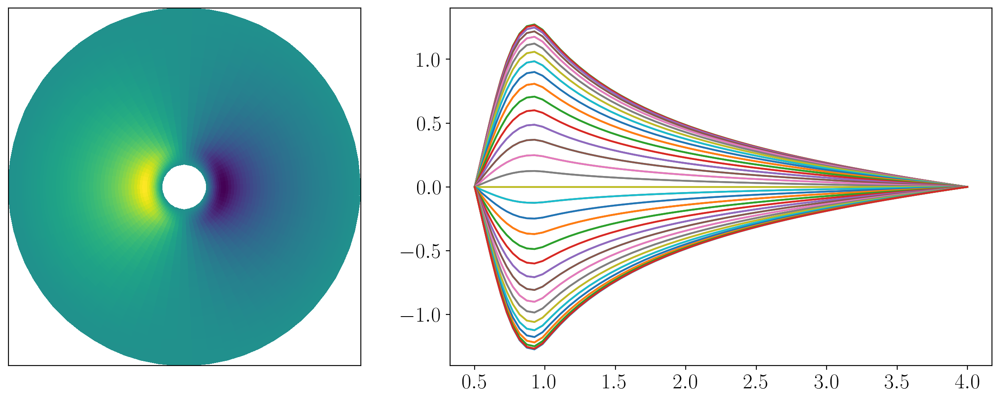

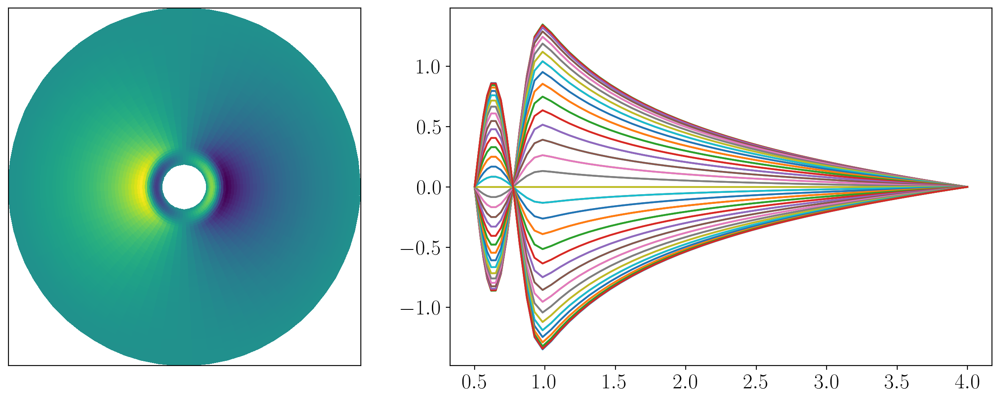

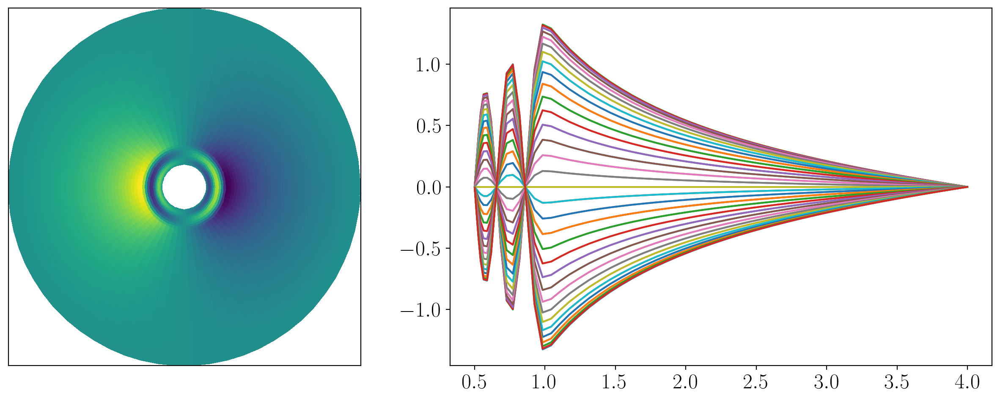

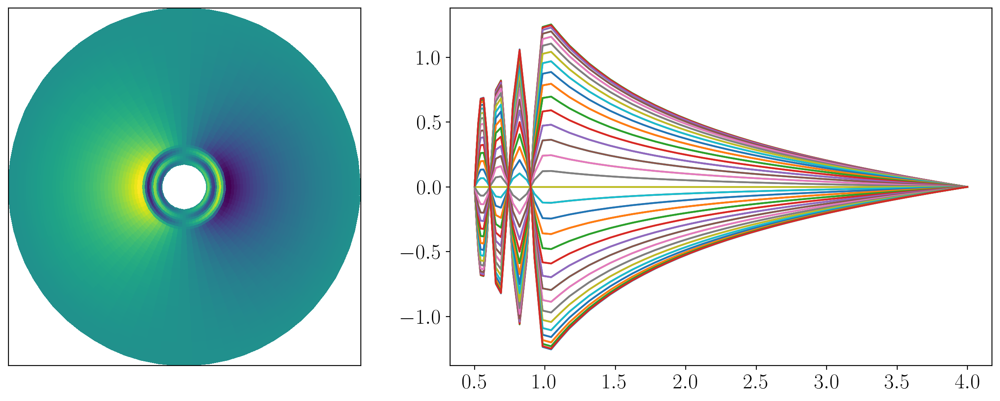

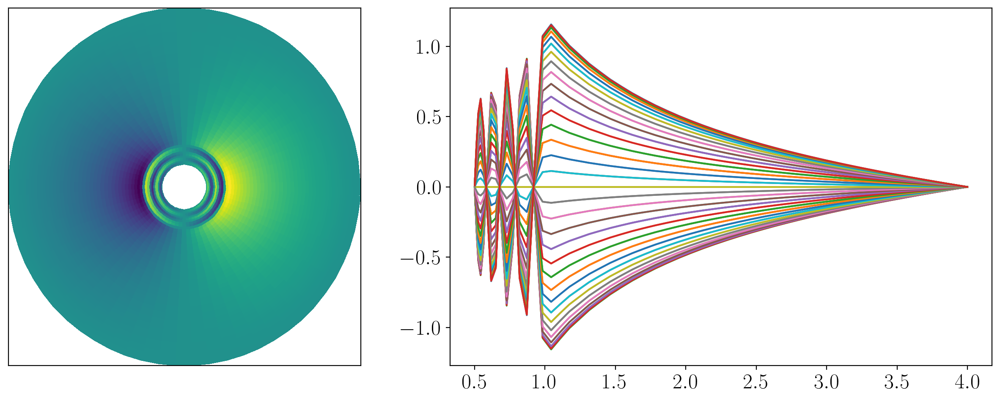

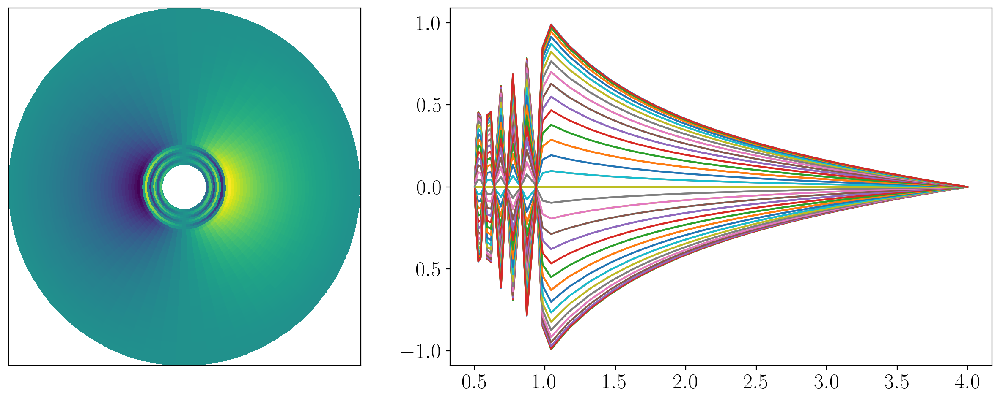

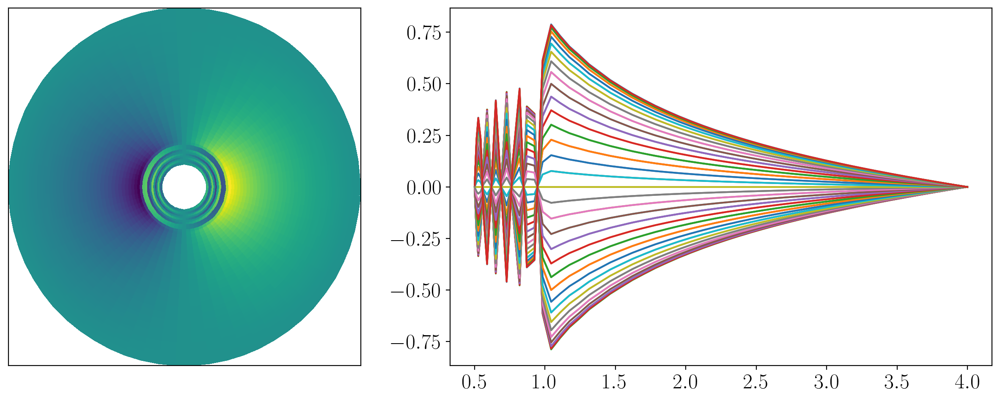

In [8]:
mode_order = np.argsort((np.real(1/solver_uncoupled.eigenvalues)))
eigs_order = np.abs(np.sort((np.real(1/solver_uncoupled.eigenvalues))))
## plot subsystem solution
R,THETA = np.meshgrid(r,θ)
x = R*np.cos(THETA); y=R*np.sin(THETA)

for i in mode_order[:7]:
    fig,(ax,ax1) = plt.subplots(1,2, figsize=(15,5.5),gridspec_kw={'width_ratios': [1.3,2]})
    solver_uncoupled.set_state(i, solver_uncoupled.subsystems[sub])
    ax.pcolormesh(x,y,(Φ['g'].real))
    for j in range(Nθ):
        ax1.plot(np.squeeze(r),np.real(Φ['g'])[j,:])
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

### Coupled problem

In [9]:
%%time
solver_coupled = problem.build_solver(matrix_coupling=(True,True))
solver_coupled.solve_dense(solver_coupled.subproblems[0])
# np.abs(np.sort(1/solver_coupled.eigenvalues.real))[:10] 

TypeError: unsupported operand type(s) for +: 'NoneType' and 'int'

## (no `hinv` terms, turned out the same)

In [10]:
Ri, Ro, Rb = 0.5, 4, 1 #note - Ri (inner radius) is 'a' from previous, also we will now have Rb as a parameter for the shelf break / edge of the bathymetry 
Nθ, Nr = 64, 64 #resolution (want higher in r than θ)
α = 1 #bathymetry parameter
dealias = 2

## basis
dtype   = np.complex128
coords  = d3.PolarCoordinates('θ', 'r')
dist    = d3.Distributor(coords, dtype=dtype)
basis   = d3.AnnulusBasis(coords, shape = (Nθ, Nr), radii = (Ri,Ro), dealias = dealias, dtype = dtype)

# Fields
Φ    = dist.Field(name='Φ',    bases=basis)
tau1 = dist.Field(name='tau1', bases=basis.outer_edge)
tau2 = dist.Field(name='tau2', bases=basis.outer_edge)
ωinv = dist.Field(name='ωinv')

# Substitutions
θ, r       = dist.local_grids(basis)
lift_basis = basis.derivative_basis(2)
tau_terms  = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
h       = dist.Field(name='h',bases=basis.radial_basis) #define the bathymetry - note this will differ in more complex problems, later will also be in θ_basis but not here
h['g']  = r**(2*α)
h['g'][r>Rb] = 1

er = dist.VectorField(coords, bases=basis.radial_basis)
er['g'][1] = 1
m_func     = lambda m: abs(m)
abs_m      = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("h*lap(Φ) - grad(h)@grad(Φ) - 1j*ωinv*(skew(grad(Φ))@grad(h)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
problem.add_equation("Φ(r=Ro)=0") #outer BC
# problem.add_equation("(er@grad(Φ))(r=Ro) + abs_m(Φ(r=Ro)) / Ro = 0") #outer BC (dirichlet neumann)


{'LHS': interp(<Field 5264835840>, r=4),
 'RHS': 0,
 'condition': 'True',
 'tensorsig': (),
 'dtype': numpy.complex128,
 'M': 0,
 'L': interp(<Field 5264835840>, r=4),
 'domain': <dedalus.core.domain.Domain at 0x13a89afc0>,
 'matrix_dependence': array([ True,  True]),
 'matrix_coupling': array([False,  True])}

### Separable problem

Same as the `hinv` case

In [11]:
# Solve (individual separable modes...)
sub = 2 #there are 0-63 subproblems...
solver_uncoupled = problem.build_solver()
solver_uncoupled.solve_dense(solver_uncoupled.subproblems[sub]) 
np.abs(np.sort(1/solver_uncoupled.eigenvalues.real))[:10] 

2024-08-08 09:49:44,000 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 3.0e+00/s


array([0.16951596, 0.03699639, 0.01462495, 0.00767937, 0.00467608,
       0.00312441, 0.00230015, 0.00172407, 0.00133083, 0.00109233])

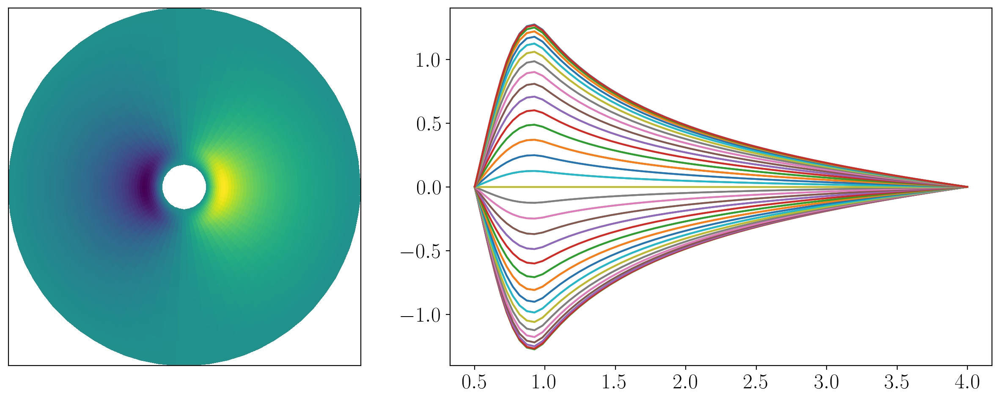

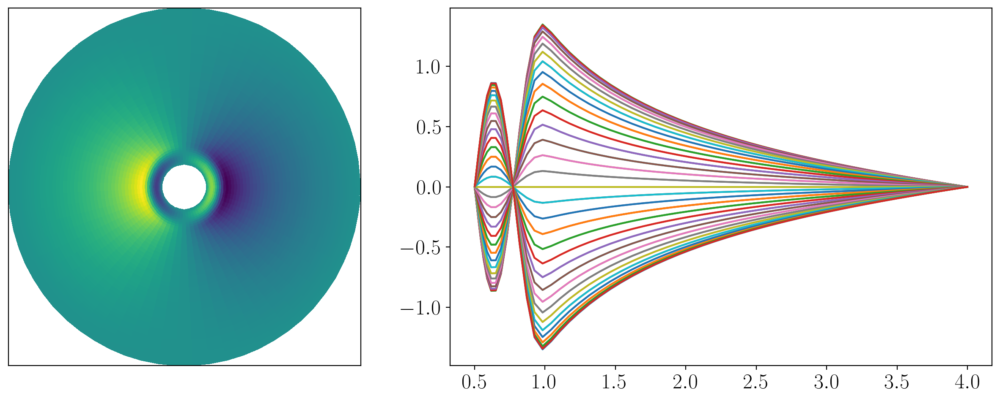

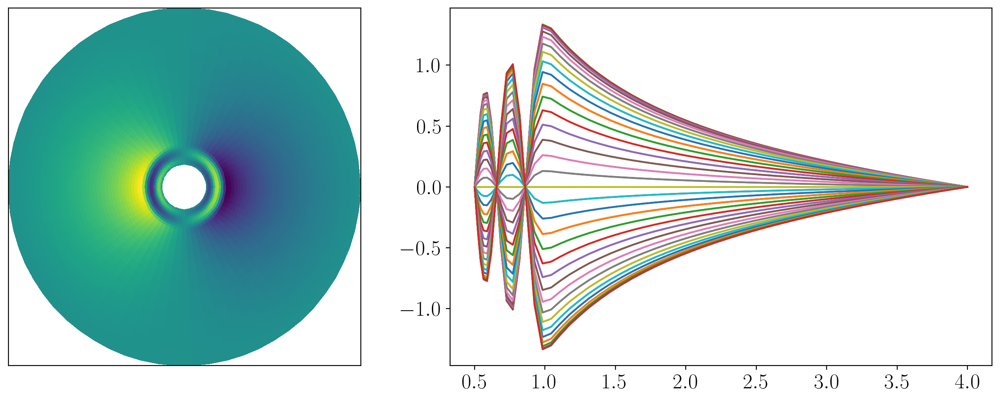

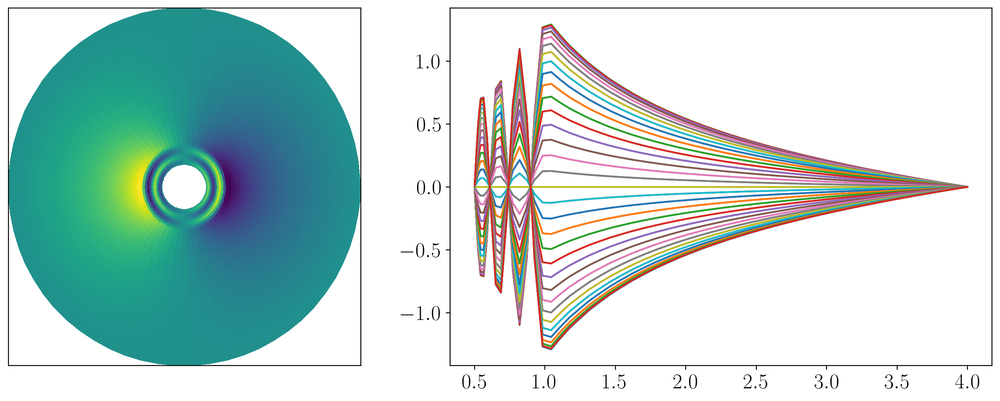

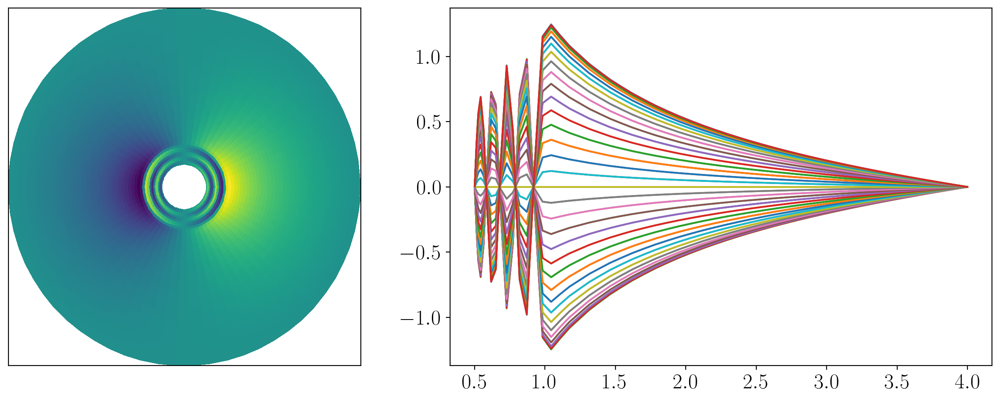

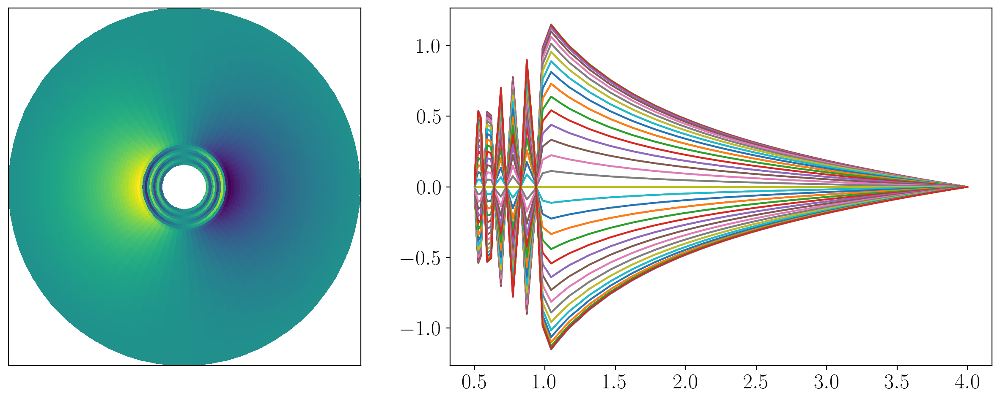

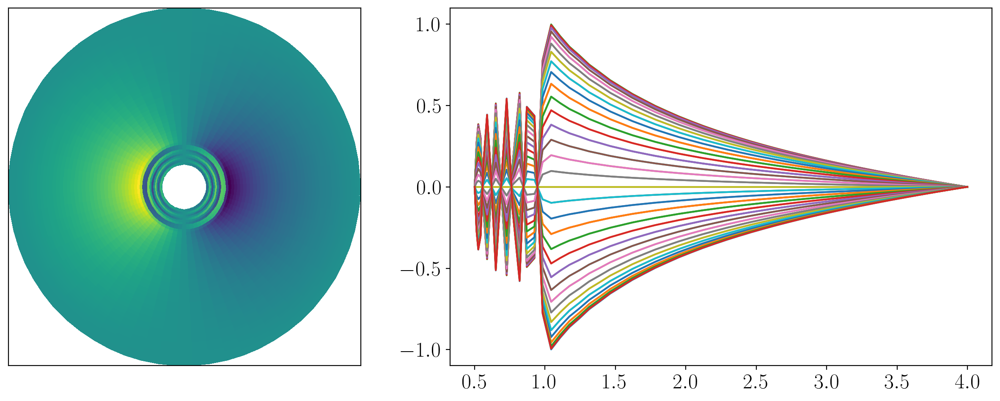

In [12]:
mode_order = np.argsort((np.real(1/solver_uncoupled.eigenvalues)))
eigs_order = np.abs(np.sort((np.real(1/solver_uncoupled.eigenvalues))))
## plot subsystem solution
R,THETA = np.meshgrid(r,θ)
x = R*np.cos(THETA); y=R*np.sin(THETA)

for i in mode_order[:7]:
    fig,(ax,ax1) = plt.subplots(1,2, figsize=(15,5.5),gridspec_kw={'width_ratios': [1.3,2]})
    solver_uncoupled.set_state(i, solver_uncoupled.subsystems[sub])
    ax.pcolormesh(x,y,(Φ['g'].real))
    for j in range(Nθ):
        ax1.plot(np.squeeze(r),np.real(Φ['g'])[j,:])
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

### Coupled problem

In [13]:
%%time
solver_coupled = problem.build_solver(matrix_coupling=(True,True))
solver_coupled.solve_dense(solver_coupled.subproblems[0])
# np.abs(np.sort(1/solver_coupled.eigenvalues.real))[:10] 

TypeError: unsupported operand type(s) for +: 'NoneType' and 'int'

# Dirichlet ot Neumann

In [14]:
Ri, Ro, Rb = 0.5, 4, 1 #note - Ri (inner radius) is 'a' from previous, also we will now have Rb as a parameter for the shelf break / edge of the bathymetry 
Nθ, Nr = 64, 64 #resolution (want higher in r than θ)
α = 1 #bathymetry parameter
dealias = 2

## basis
dtype   = np.complex128
coords  = d3.PolarCoordinates('θ', 'r')
dist    = d3.Distributor(coords, dtype=dtype)
basis   = d3.AnnulusBasis(coords, shape = (Nθ, Nr), radii = (Ri,Ro), dealias = dealias, dtype = dtype)

# Fields
Φ    = dist.Field(name='Φ',    bases=basis)
tau1 = dist.Field(name='tau1', bases=basis.outer_edge)
tau2 = dist.Field(name='tau2', bases=basis.outer_edge)
ωinv = dist.Field(name='ωinv')

# Substitutions
θ, r       = dist.local_grids(basis)
lift_basis = basis.derivative_basis(2)
tau_terms  = d3.Lift(tau1, lift_basis, -1) + d3.Lift(tau2, lift_basis, -2)
hinv       = dist.Field(name='hinv',bases=basis.radial_basis) #define the bathymetry - note this will differ in more complex problems, later will also be in θ_basis but not here
hinv['g']  = r**(-2*α)
hinv['g'][r>Rb] = 1

er = dist.VectorField(coords, bases=basis.radial_basis)
er['g'][1] = 1
m_func     = lambda m: abs(m)
abs_m      = lambda A: abs_m_cls(A, coords['θ']) #note this implements the Dirichlet-to-Neumann BC

# Problem
problem = d3.EVP([Φ, tau1, tau2], eigenvalue=ωinv, namespace=locals())
problem.add_equation("hinv*lap(Φ) + grad(hinv)@grad(Φ) + 1j*ωinv*(skew(grad(Φ))@grad(hinv)) + tau_terms = 0 ")
problem.add_equation("Φ(r=Ri)=0") #inner BC
# problem.add_equation("Φ(r=Ro)=0") #outer BC
problem.add_equation("(er@grad(Φ))(r=Ro) + abs_m(Φ(r=Ro)) / Ro = 0") #outer BC (dirichlet neumann)


{'LHS': Add(interp(Dot(<Field 5265013936>, Grad(<Field 5262777408>)), r=4), Mul(0.25, abs_m(interp(<Field 5262777408>, r=4)))),
 'RHS': 0,
 'condition': 'True',
 'tensorsig': (),
 'dtype': dtype('complex128'),
 'M': 0,
 'L': Add(interp(Dot(<Field 5265013936>, Grad(<Field 5262777408>)), r=4), Mul(0.25, abs_m(interp(<Field 5262777408>, r=4)))),
 'domain': <dedalus.core.domain.Domain at 0x13a8a1730>,
 'matrix_dependence': array([ True,  True]),
 'matrix_coupling': array([False,  True])}

In [15]:
# Solve (individual separable modes...)
sub = 2 #there are 0-63 subproblems...
solver_uncoupled = problem.build_solver()
solver_uncoupled.solve_dense(solver_uncoupled.subproblems[sub]) 
np.abs(np.sort(1/solver_uncoupled.eigenvalues.real))[:10] 

2024-08-08 09:50:52,789 subsystems 0/1 INFO :: Building subproblem matrices 1/1 (~100%) Elapsed: 0s, Remaining: 0s, Rate: 2.3e+00/s


array([0.17243247, 0.03711967, 0.01463124, 0.00766158, 0.00467325,
       0.00313291, 0.00227593, 0.00171658, 0.00133734, 0.00106711])

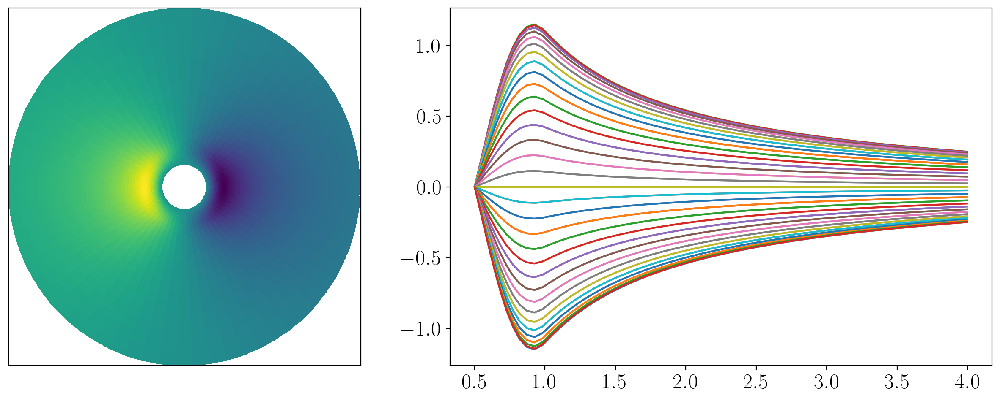

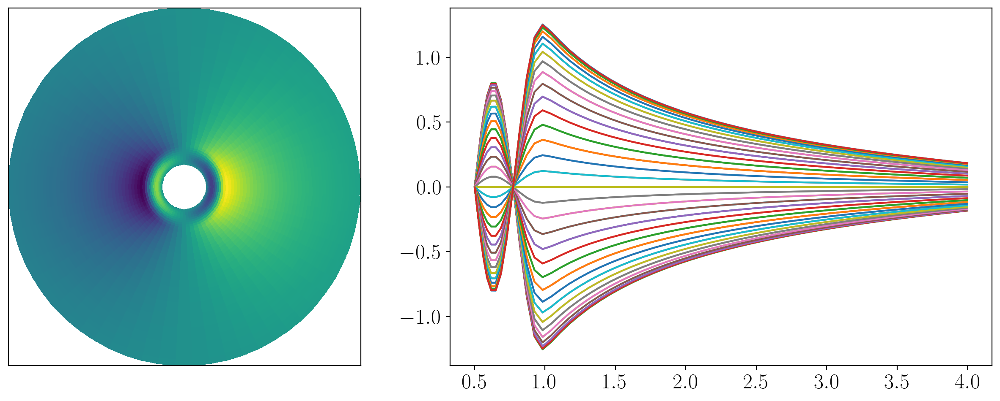

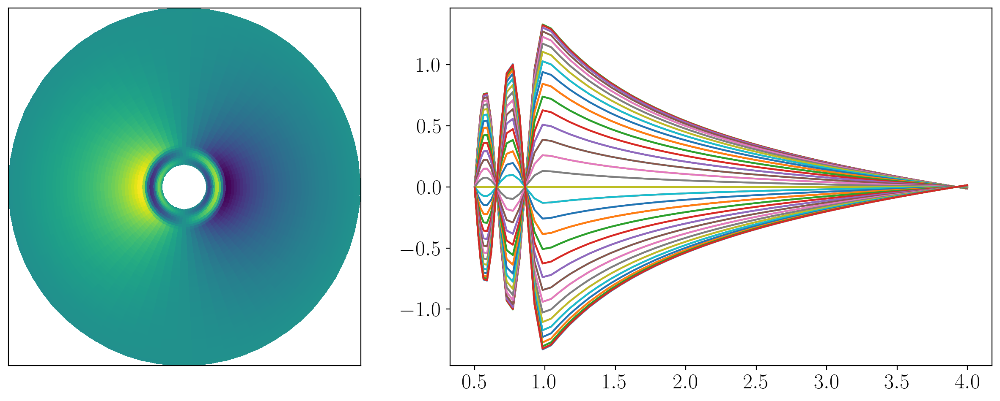

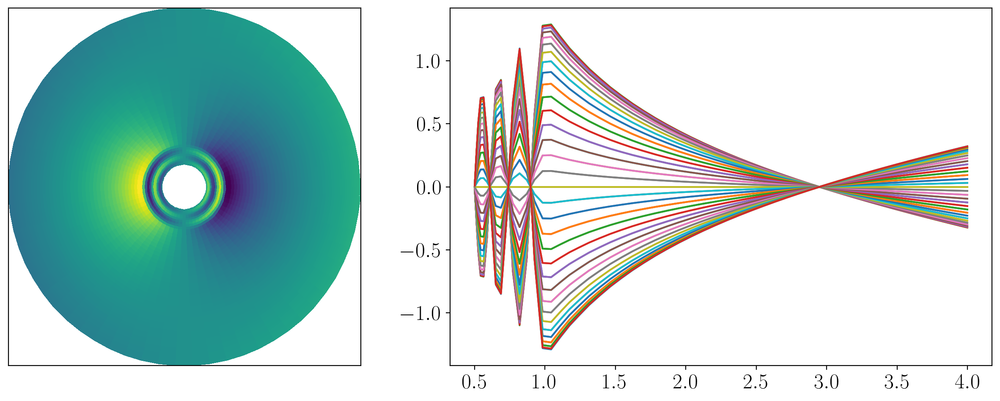

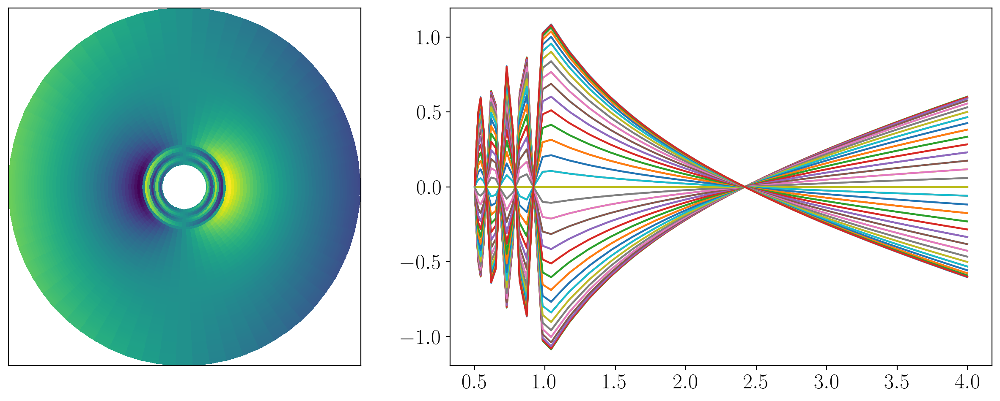

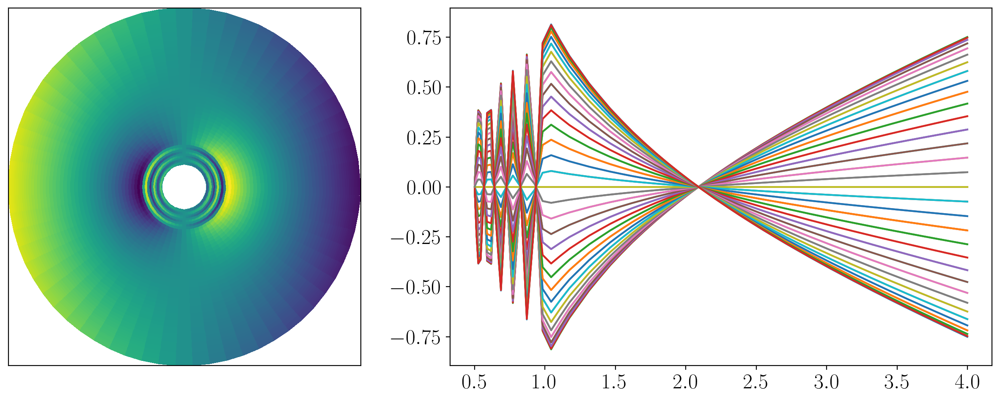

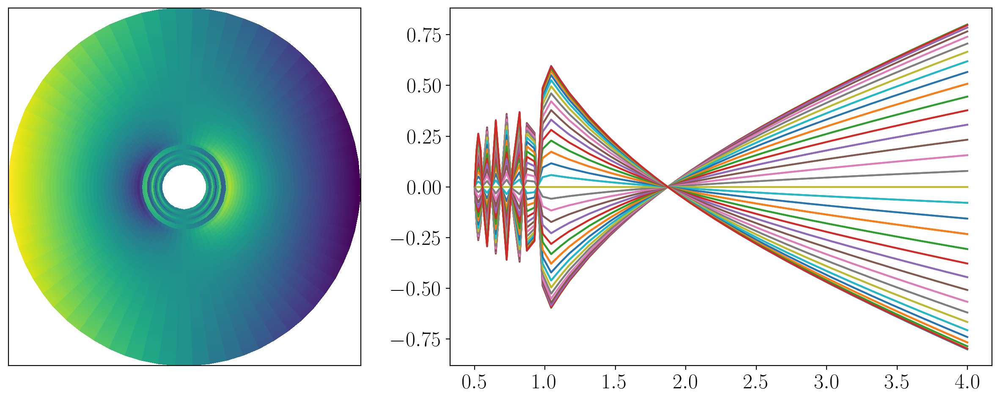

In [16]:
mode_order = np.argsort((np.real(1/solver_uncoupled.eigenvalues)))
eigs_order = np.abs(np.sort((np.real(1/solver_uncoupled.eigenvalues))))
## plot subsystem solution
R,THETA = np.meshgrid(r,θ)
x = R*np.cos(THETA); y=R*np.sin(THETA)

for i in mode_order[:7]:
    fig,(ax,ax1) = plt.subplots(1,2, figsize=(15,5.5),gridspec_kw={'width_ratios': [1.3,2]})
    solver_uncoupled.set_state(i, solver_uncoupled.subsystems[sub])
    ax.pcolormesh(x,y,(Φ['g'].real))
    for j in range(Nθ):
        ax1.plot(np.squeeze(r),np.real(Φ['g'])[j,:])
    ax.set_xticks([]);ax.set_yticks([])
    plt.show()

Don't love what's happening in the far field here...

In [17]:
%%time
solver_coupled = problem.build_solver(matrix_coupling=(True,True))
solver_coupled.solve_dense(solver_coupled.subproblems[0])
# np.abs(np.sort(1/solver_coupled.eigenvalues.real))[:10] 

TypeError: unsupported operand type(s) for +: 'NoneType' and 'int'